# GW coupling skymaps & beta scans

Notebook version of `plot_GW_coupling_skymap.py`.

- Reads the `TT_gauge_*.pkl` files produced by `GW_coupling_TT_E_D_fields.py`.
- Maps |C+| and |C×| onto the sky (Mollweide) for a given site / time / cavity-axis orientation.
- Plots beta vs C+ / C× for the first and last phi slices of each mode.

The cavity (magnet) axis orientation is set by `AXIS_ALT_DEG` / `AXIS_AZ_DEG`
(alt=0, az=90 = horizontal magnet pointing due East; alt=90 = old vertical assumption).

In [1]:
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import RegularGridInterpolator
from astropy.time import Time
from astropy.coordinates import EarthLocation, AltAz, SkyCoord
from astropy import units as u

%matplotlib inline
plt.rcParams["font.size"] = 11
plt.rcParams["font.family"] = "serif"
plt.rcParams["mathtext.fontset"] = "dejavuserif"

# INFN Frascati National Laboratories (FLASH site).
FRASCATI_LOCATION = EarthLocation(lat=41.808521 * u.deg, lon=12.676104 * u.deg, height=320 * u.m)

## Cavity-frame coordinate transform

In [2]:
def compute_theta_2pi(d, v, w):
    """Azimuth of direction d around axis v, measured from reference w, in [0, 2pi)."""
    d_perp = d - np.dot(d, v) * v
    d_perp /= np.linalg.norm(d_perp)
    cos_theta = np.clip(np.dot(d_perp, w), -1.0, 1.0)
    theta = np.arccos(cos_theta)
    sign = np.sign(np.dot(v, np.cross(w, d_perp)))
    return theta if sign >= 0 else 2 * np.pi - theta


def _altaz_unit_vector(altaz_frame, alt_deg, az_deg):
    """ICRS unit vector of a direction given by altitude/azimuth at the site."""
    coord = SkyCoord(alt=alt_deg * u.deg, az=az_deg * u.deg, frame=altaz_frame).transform_to("icrs")
    return np.array([coord.cartesian.x.value, coord.cartesian.y.value, coord.cartesian.z.value])


def skymap(location, time=Time("2026-01-01 00:00:00"), axis_alt_deg=0.0, axis_az_deg=90.0):
    """
    Build an RA/Dec grid and express each sky direction in the cavity frame.

    The cavity symmetry (z) axis points along the local altitude/azimuth direction
    (axis_alt_deg, axis_az_deg). The default (alt=0, az=90) is a horizontal magnet
    pointing due East; the old vertical-cavity assumption corresponds to alt=90.

    Returns
    -------
    ra_moll, dec_moll : Mollweide plot coordinates [rad]
    theta_vals : azimuth of each direction around the cavity axis [rad]
    phi_deg : polar angle of each direction from the cavity axis [deg]
    """
    altaz_frame = AltAz(obstime=time, location=location)
    axis_vector = _altaz_unit_vector(altaz_frame, axis_alt_deg, axis_az_deg)

    # Reference direction for the azimuth zero: the local zenith projected onto the
    # plane perpendicular to the cavity axis. For a (near-)vertical axis the zenith
    # is parallel to the axis, so fall back to East as the reference.
    zenith_vector = _altaz_unit_vector(altaz_frame, 90.0, 0.0)
    reference = zenith_vector - np.dot(zenith_vector, axis_vector) * axis_vector
    if np.linalg.norm(reference) < 1e-8:
        east_vector = _altaz_unit_vector(altaz_frame, 0.0, 90.0)
        reference = east_vector - np.dot(east_vector, axis_vector) * axis_vector
    reference /= np.linalg.norm(reference)

    d_res = 2
    ra_vals = np.arange(0, 360 + d_res, d_res)
    dec_vals = np.arange(-90, 90 + d_res, d_res)
    ra_grid, dec_grid = np.meshgrid(ra_vals, dec_vals)
    ra_flat = ra_grid.flatten()
    dec_flat = dec_grid.flatten()

    grid_coords = SkyCoord(ra=ra_flat * u.deg, dec=dec_flat * u.deg, frame="icrs")
    grid_vectors = np.array(
        [grid_coords.cartesian.x.value, grid_coords.cartesian.y.value, grid_coords.cartesian.z.value]
    ).T

    dots = np.clip(grid_vectors @ axis_vector, -1.0, 1.0)
    phi_deg = np.degrees(np.arccos(dots))

    theta_vals = np.array([compute_theta_2pi(d, axis_vector, reference) for d in grid_vectors])

    ra_moll = np.radians(ra_flat - 180)
    dec_moll = np.radians(dec_flat)
    return ra_moll, dec_moll, theta_vals, phi_deg

## Pickle loading helpers

In [3]:
def parse_pkl_filename(filename):
    """
    Extract (mode_label, mode_type, mode_index, freq_MHz) from a pickle filename
    such as ``TT_gauge_TM010_tuners_0deg_129.0000MHz.pkl``.
    """
    base = os.path.basename(filename)
    freq_mhz = float(base.split("_")[-1].split("MHz")[0])
    mode_label = base[len("TT_gauge_"):].rsplit("_", 1)[0]  # e.g. TM010_tuners_0deg
    mode_name = mode_label.split("_")[0]  # e.g. TM010
    return mode_label, mode_name[:2], mode_name[2:], freq_mhz


def build_interpolators(pkl_path):
    """Pivot the (beta, phi) scan and return interpolators for C+ and Cx."""
    data = pd.read_pickle(pkl_path)

    bs_u = np.sort(data["b"].unique())
    phis_u = np.sort(data["phi"].unique())

    # Coupling values are stored as complex with vanishing imaginary part.
    z_p = np.real(
        data.pivot_table(index="phi", columns="b", values="num_p")
        .reindex(index=phis_u, columns=bs_u)
        .to_numpy()
    )
    z_c = np.real(
        data.pivot_table(index="phi", columns="b", values="num_c")
        .reindex(index=phis_u, columns=bs_u)
        .to_numpy()
    )

    interp_p = RegularGridInterpolator((phis_u, bs_u), z_p, bounds_error=False, fill_value=np.nan)
    interp_c = RegularGridInterpolator((phis_u, bs_u), z_c, bounds_error=False, fill_value=np.nan)
    return interp_p, interp_c, np.nanmax(np.abs(z_p)), np.nanmax(np.abs(z_c))


def list_pkl_files(folder_base, mode_filter=""):
    """List TT_gauge_*.pkl files (optionally filtered), sorted by frequency."""
    files = [
        f
        for f in os.listdir(folder_base)
        if f.startswith("TT_gauge_") and f.endswith(".pkl") and (mode_filter in f)
    ]
    return sorted(files, key=lambda s: float(s.split("_")[-1].split("MHz")[0]))

## Configuration

In [4]:
FOLDER_BASE = "E_D_fields_FLASH_cavity"
MODE_FILTER = ""                       # e.g. "TM010" to restrict to one mode
TIME_UTC = "2026-01-01 00:00:00"
AXIS_ALT_DEG = 0.0                     # 0 = horizontal magnet, 90 = vertical
AXIS_AZ_DEG = 90.0                     # North=0, East=90 -> default: pointing due East

print("pkl files found:")
for f in list_pkl_files(FOLDER_BASE, MODE_FILTER):
    print(" ", f)

pkl files found:
  TT_gauge_TM010_tuners_0deg_128.9000MHz.pkl
  TT_gauge_TM010_tuners_45deg_133.9600MHz.pkl
  TT_gauge_TE111_tuners_0deg_135.6000MHz.pkl
  TT_gauge_TM010_tuners_90deg_156.0200MHz.pkl
  TT_gauge_TM011_tuners_0deg_163.1000MHz.pkl
  TT_gauge_TM011_tuners_45deg_167.1200MHz.pkl
  TT_gauge_TM011_tuners_90deg_185.0200MHz.pkl
  TT_gauge_TE211_tuners_0deg_190.6400MHz.pkl
  TT_gauge_TM110_tuners_0deg_203.8000MHz.pkl
  TT_gauge_TM010_tuners_135deg_212.5200MHz.pkl
  TT_gauge_TE011_tuners_0deg_218.3000MHz.pkl
  TT_gauge_TE112_tuners_0deg_219.9000MHz.pkl
  TT_gauge_TM111_tuners_0deg_227.0200MHz.pkl
  TT_gauge_TM011_tuners_135deg_234.8400MHz.pkl
  TT_gauge_TM012_tuners_0deg_237.8000MHz.pkl
  TT_gauge_TM012_tuners_45deg_240.6000MHz.pkl
  TT_gauge_TM010_tuners_180deg_249.3400MHz.pkl
  TT_gauge_TM012_tuners_90deg_253.5500MHz.pkl
  TT_gauge_TE212_tuners_0deg_257.5000MHz.pkl
  TT_gauge_TM210_tuners_0deg_259.2000MHz.pkl
  TT_gauge_TM011_tuners_180deg_268.6200MHz.pkl
  TT_gauge_TM211_tuners_

## Skymaps of |C+| and |C×|

Renders the Mollweide skymaps inline (one row of two panels per mode).

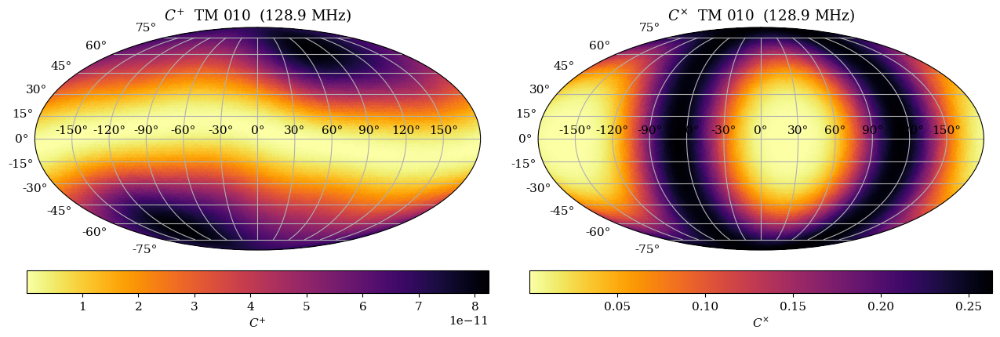

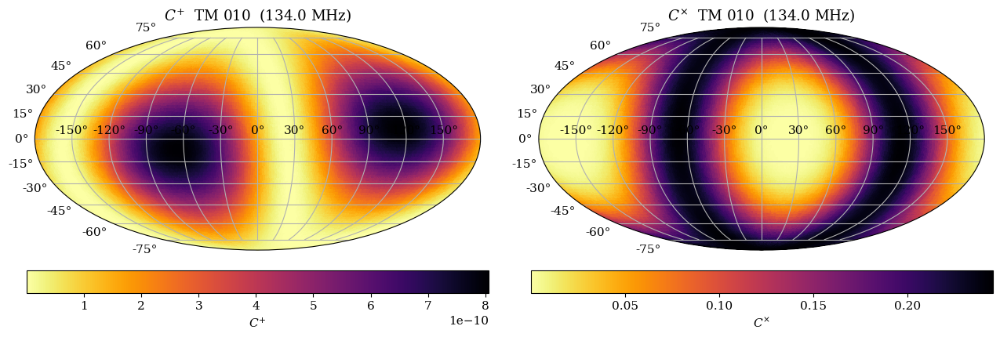

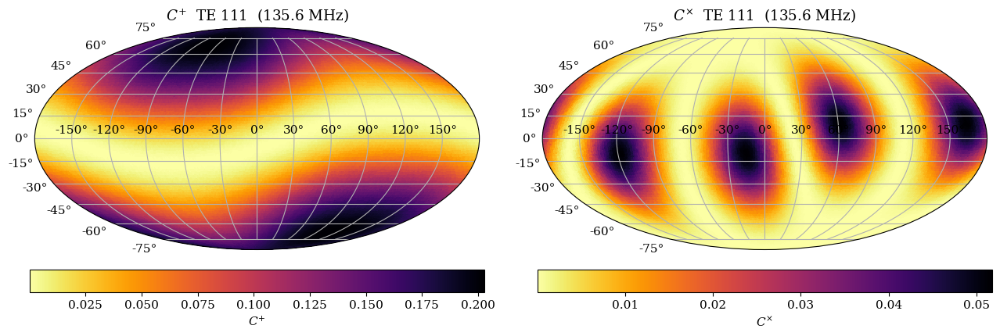

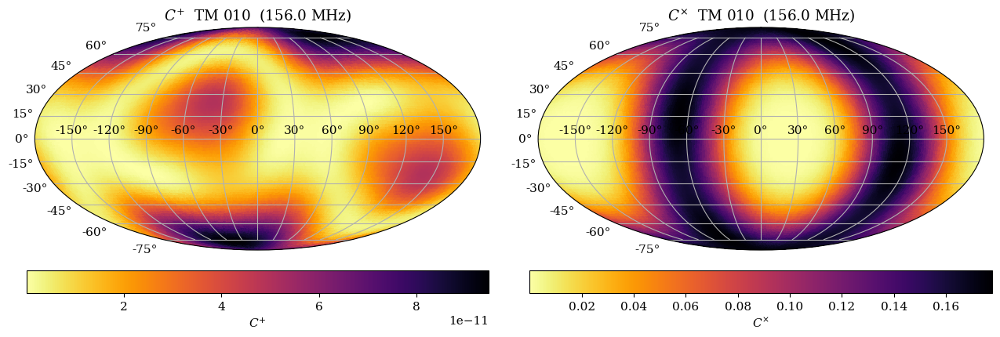

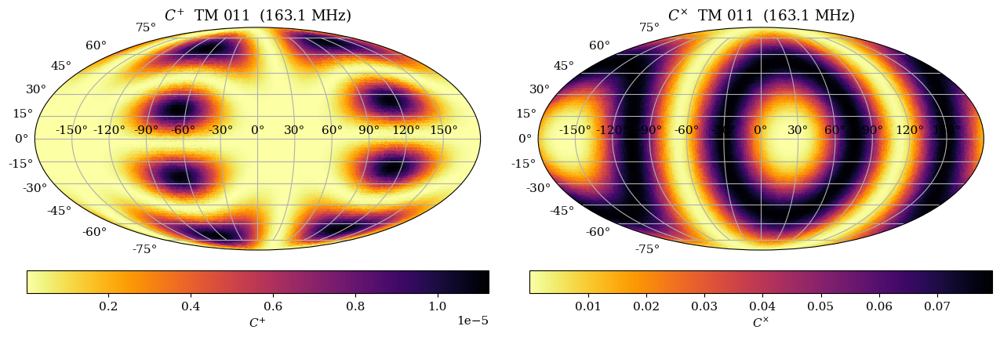

...

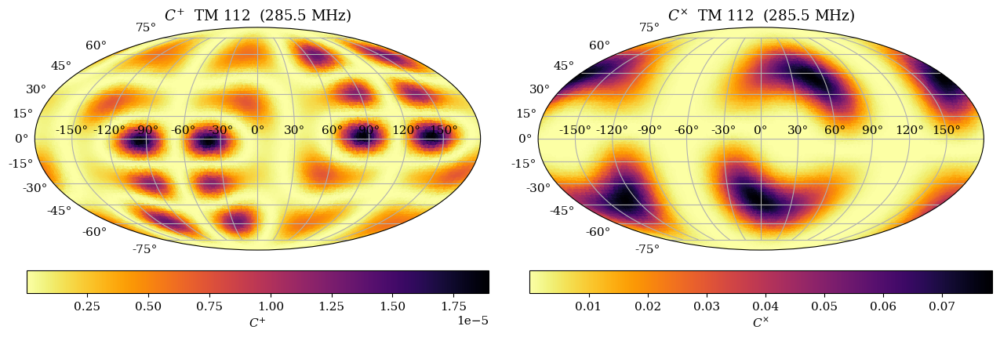

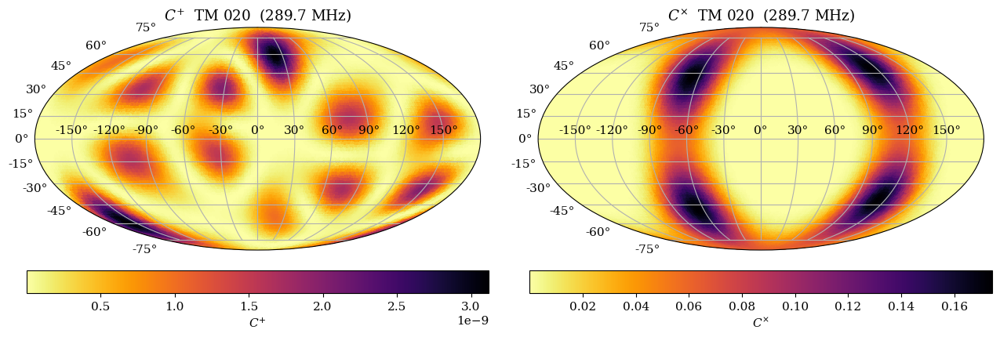

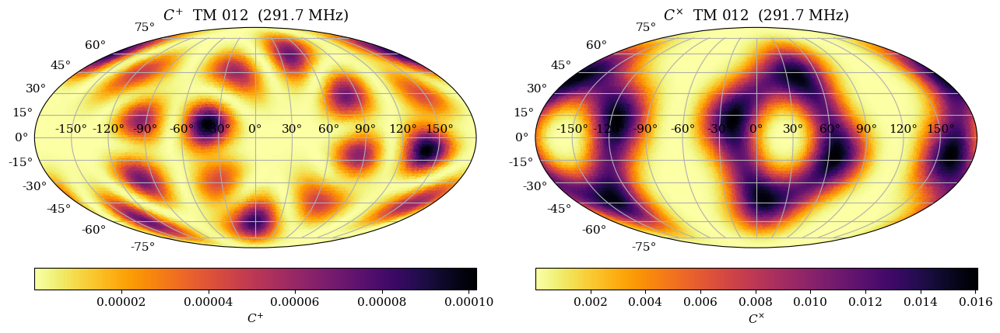

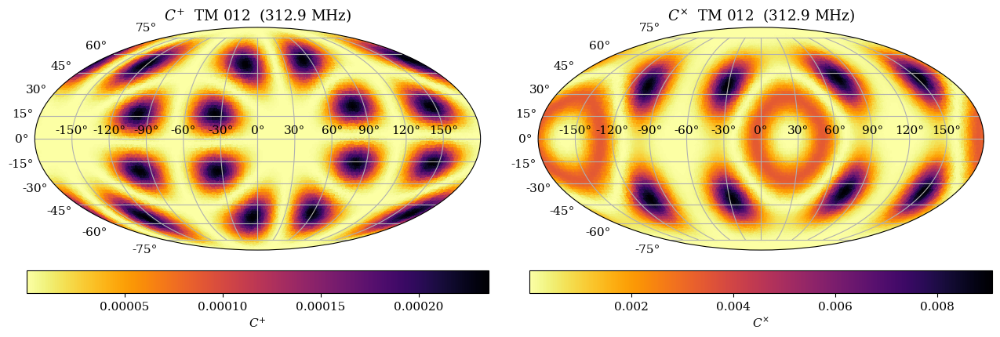

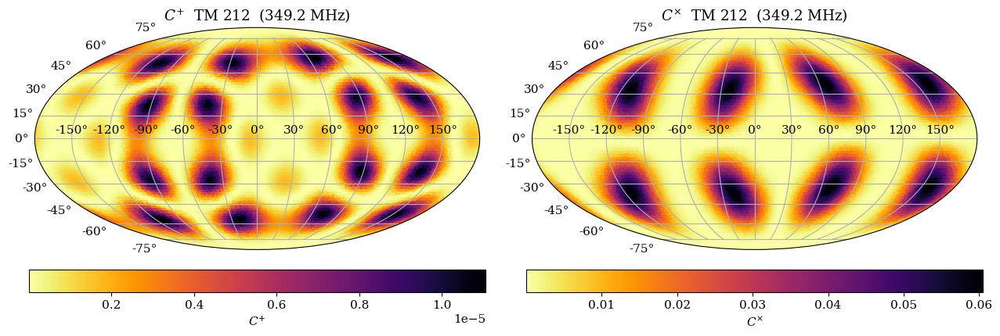

In [15]:
ra_moll, dec_moll, theta_vals, phi_deg = skymap(
    FRASCATI_LOCATION, time=Time(TIME_UTC), axis_alt_deg=AXIS_ALT_DEG, axis_az_deg=AXIS_AZ_DEG
)
cavity_coords = (theta_vals, phi_deg * np.pi / 180.0)

# Solid-angle weights for averaging over the RA/Dec grid: cells near the poles
# subtend less sky, so weight each point by cos(dec). dec_moll is the declination
# in radians, so the weight is simply cos(dec_moll).
sky_weights = np.cos(dec_moll)

def sky_average(values):
    """cos(dec)-weighted mean of `values` over the sky grid (ignores NaN)."""
    finite = np.isfinite(values)
    return np.sum(values[finite] * sky_weights[finite]) / np.sum(sky_weights[finite])

summary = {"mode": [],"tune":[], "freq_MHz": [], "Max C_p": [], "Max C_c": [], "Avg C_p": [], "Avg C_c": []}

for filename in list_pkl_files(FOLDER_BASE, MODE_FILTER):
    mode_label, mtype, midx, freq_mhz = parse_pkl_filename(filename)
    interp_p, interp_c, max_p, max_c = build_interpolators(os.path.join(FOLDER_BASE, filename))

    vals_p = np.abs(interp_p(cavity_coords))
    vals_c = np.abs(interp_c(cavity_coords))

    summary["mode"].append(mode_label.split('_')[0])
    summary["tune"].append(mode_label.split('_')[-1])
    summary["freq_MHz"].append(freq_mhz)
    summary["Max C_p"].append(max_p)
    summary["Max C_c"].append(max_c)
    summary["Avg C_p"].append(sky_average(vals_p))
    summary["Avg C_c"].append(sky_average(vals_c))

    fig = plt.figure(figsize=(13, 4.2))
    for j, (vals, sym) in enumerate([(vals_p, r"$C^{+}$"), (vals_c, r"$C^{\times}$")]):
        ax = fig.add_subplot(1, 2, j + 1, projection="mollweide")
        sc = ax.tripcolor(ra_moll, dec_moll, vals, shading="flat", cmap="inferno_r", rasterized=True)
        cbar = plt.colorbar(sc, ax=ax, orientation="horizontal", pad=0.07)
        cbar.set_label(sym)
        ax.set_title(f"{sym}  {mtype} {midx}  ({freq_mhz:.1f} MHz)")
        ax.grid(True)
    plt.tight_layout()
    plt.show()

In [18]:
summary_df = pd.DataFrame(summary)
summary_df.sort_values(by = 'mode')

,mode,tune,freq_MHz,Max C_p,Max C_c,Avg C_p,Avg C_c
10,TE011,0deg,218.30,1.258318e-01,0.000057,5.948973e-02,0.000013
2,TE111,0deg,135.60,2.029304e-01,0.051931,7.546775e-02,0.012217
11,TE112,0deg,219.90,5.436936e-02,0.028970,1.083179e-02,0.003280
7,TE211,0deg,190.64,1.894642e-01,0.017029,5.294234e-02,0.004062
18,TE212,0deg,257.50,6.905977e-02,0.018396,1.693116e-02,0.002552
0,TM010,0deg,128.90,8.256406e-11,0.263446,3.036090e-11,0.133202
1,TM010,45deg,133.96,8.063334e-10,0.245325,2.740087e-10,0.122195
3,TM010,90deg,156.02,9.497489e-11,0.177883,2.194459e-11,0.082753
16,TM010,180deg,249.34,1.422415e-08,0.020922,3.027871e-09,0.002334
9,TM010,135deg,212.52,5.055676e-11,0.058770,1.712289e-11,0.020801


## beta vs C+ / C× at phi = 0 and phi = π

For each mode at one tuning angle (selected via `TUNER_FILTER`), this takes the
phi slices nearest to **0** and **π** and plots C+ and C× against beta.

Plotting beta scans for 21 file(s) (tuner filter = '0deg').


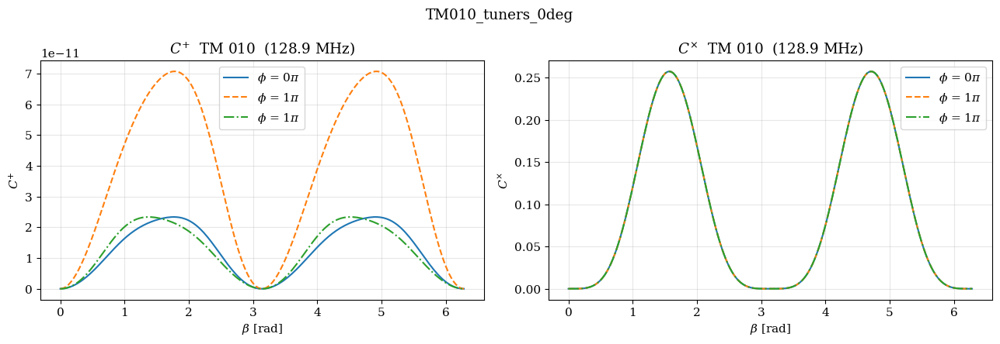

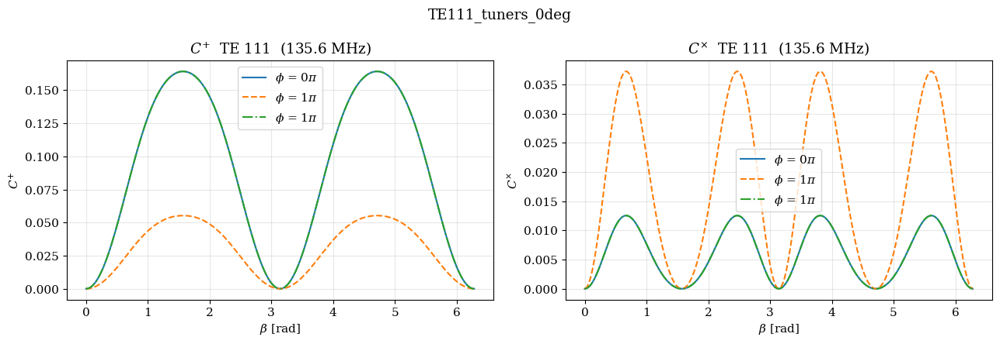

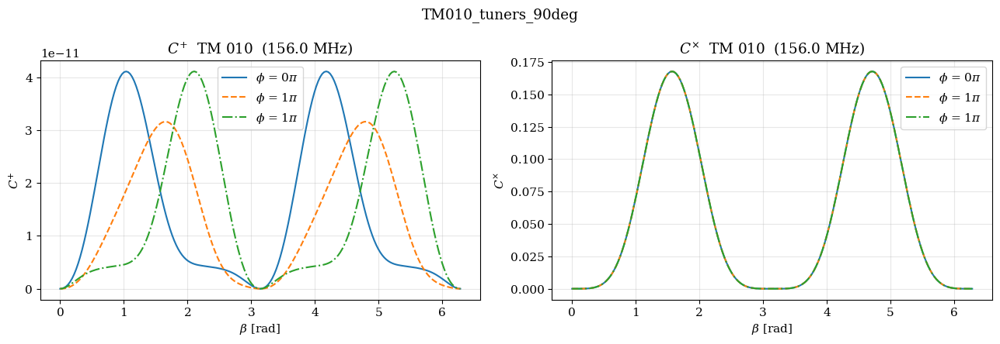

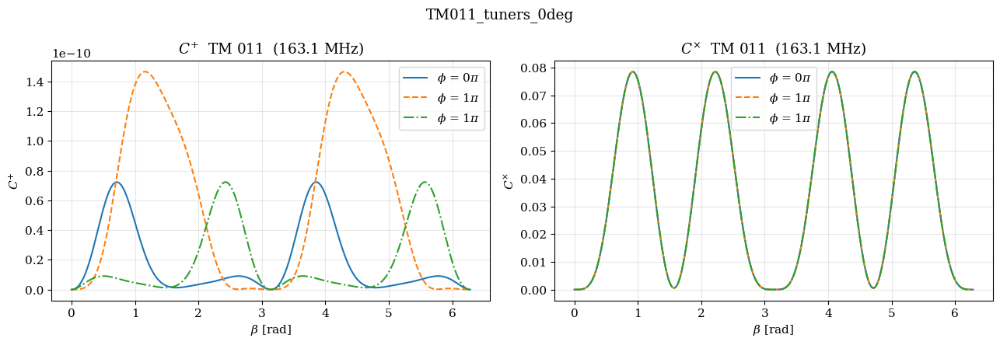

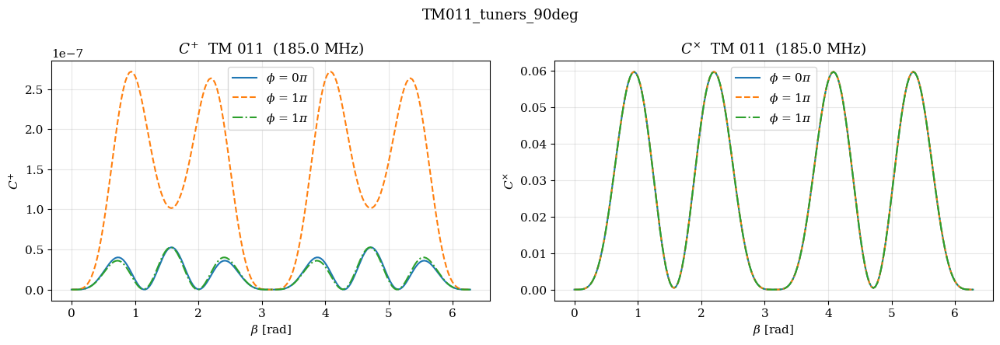

...

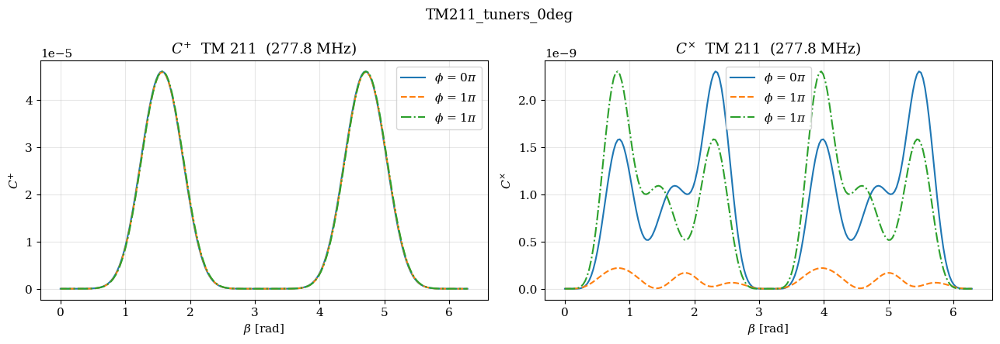

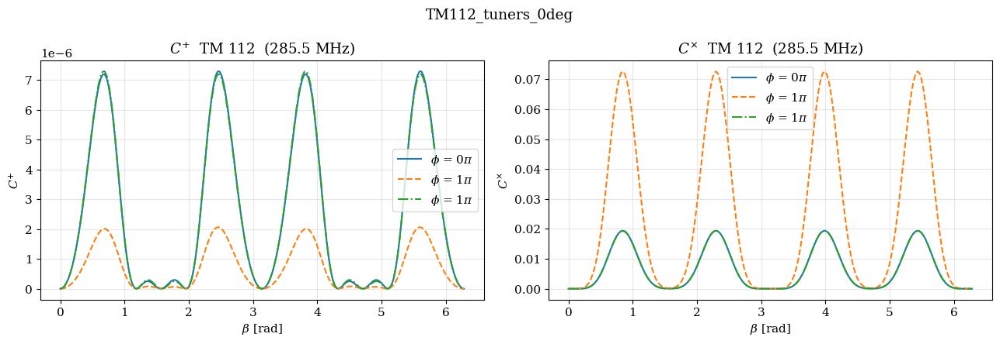

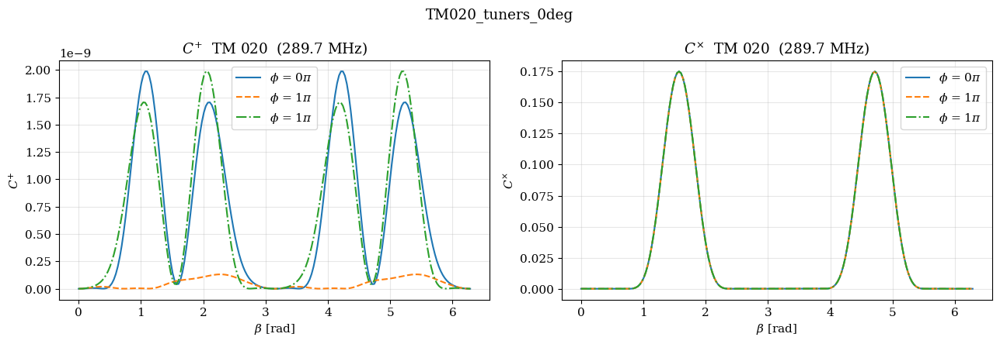

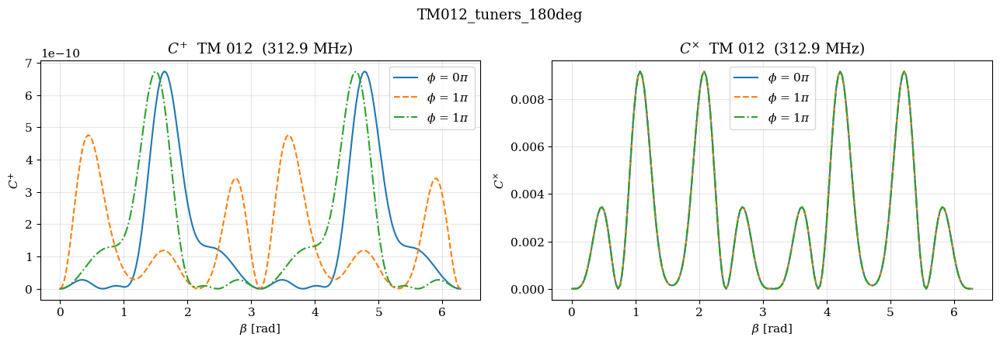

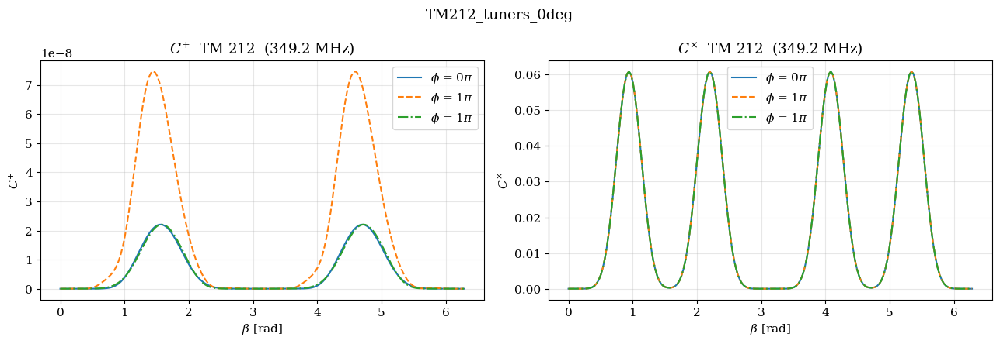

In [7]:
TUNER_FILTER = "0deg"     # one tuning angle per mode; e.g. "0deg", "45deg", ...
PHI_TARGETS = [0.0, np.pi/2,np.pi]   # phi slices to plot (rad)
Phi_names = [phi / np.pi for phi in PHI_TARGETS]

pkl_files = list_pkl_files(FOLDER_BASE, MODE_FILTER)
pkl_files = [f for f in pkl_files if TUNER_FILTER in f]
print(f"Plotting beta scans for {len(pkl_files)} file(s) (tuner filter = '{TUNER_FILTER}').")

for filename in pkl_files:
    mode_label, mtype, midx, freq_mhz = parse_pkl_filename(filename)
    data = pd.read_pickle(os.path.join(FOLDER_BASE, filename))

    phis = np.sort(data["phi"].unique())
    phi_slices = [phis[np.argmin(np.abs(phis - target))] for target in PHI_TARGETS]

    fig, (ax_p, ax_c) = plt.subplots(1, 2, figsize=(13, 4.5))
    for phi_val, style in zip(phi_slices, ["-", "--",'-.']):
        sl = data[np.isclose(data["phi"], phi_val)].sort_values("b")
        beta = sl["b"].to_numpy()
        cp = np.abs(np.real(sl["num_p"].to_numpy(complex)))
        cc = np.abs(np.real(sl["num_c"].to_numpy(complex)))
        ax_p.plot(beta, cp, style, label=fr"$\phi$ = {phi_val /np.pi:.0f}$\pi$")
        ax_c.plot(beta, cc, style, label=fr"$\phi$ = {phi_val /np.pi:.0f}$\pi$")

    for ax, sym in [(ax_p, r"$C^{+}$"), (ax_c, r"$C^{\times}$")]:
        ax.set_xlabel(r"$\beta$ [rad]")
        ax.set_ylabel(sym)
        ax.set_title(f"{sym}  {mtype} {midx}  ({freq_mhz:.1f} MHz)")
        ax.legend()
        ax.grid(True, alpha=0.3)
    fig.suptitle(mode_label)
    plt.tight_layout()
    plt.show()

## Validation: AltAz -> equatorial (RA/Dec) transform at the INFN/Frascati site

Checks that astropy's local-horizon -> equatorial conversion used inside `skymap()`
is correct, independently of the cavity physics. Two cross-checks:

1. **Manual spherical trigonometry vs astropy.** The classic alt/az -> hour-angle/Dec
   formulas (apparent place, of-date) are compared against astropy's transform into
   the matched of-date frame (`TETE`). Agreement should be ~arcsec
   (residual = diurnal aberration).
2. **Textbook identities** at this site/time:
   - zenith Dec == geodetic latitude
   - zenith RA == local apparent sidereal time (LST)
   - due-East / due-West horizon points lie on the celestial equator (Dec = 0)
   - the point at (alt = latitude, az = 0) is the North Celestial Pole (Dec = +90)

Note: these identities hold in the **of-date** frame. The production skymap is drawn in
**ICRS (J2000)**; ICRS and of-date differ by precession/nutation (~0.4 deg here), which is
an overall rotation of the whole sky and does not change the coupling pattern (which depends
only on the angle between each direction and the cavity axis).

In [8]:
from astropy.coordinates import AltAz, SkyCoord

_loc = FRASCATI_LOCATION
_t = Time(TIME_UTC)
_lat_d = _loc.lat.deg
_lat = _loc.lat.rad
_frame = AltAz(obstime=_t, location=_loc)
_lst = _t.sidereal_time("apparent", longitude=_loc.lon)

def _astro_radec(alt, az, fr="tete"):
    c = SkyCoord(alt=alt * u.deg, az=az * u.deg, frame=_frame).transform_to(fr)
    return c.ra.deg, c.dec.deg

def _manual_radec(alt_d, az_d):
    """Apparent RA/Dec from alt/az via standard spherical-astronomy formulas."""
    alt, az = np.radians(alt_d), np.radians(az_d)
    dec = np.arcsin(np.sin(_lat) * np.sin(alt) + np.cos(_lat) * np.cos(alt) * np.cos(az))
    ha = np.arctan2(-np.sin(az) * np.cos(alt),
                    np.cos(_lat) * np.sin(alt) - np.sin(_lat) * np.cos(alt) * np.cos(az))
    return (np.degrees(_lst.rad - ha)) % 360, np.degrees(dec)

def _sep_arcsec(a, b):
    return SkyCoord(a[0]*u.deg, a[1]*u.deg).separation(SkyCoord(b[0]*u.deg, b[1]*u.deg)).arcsec

print(f"Site: lat={_lat_d:.4f} deg, lon={_loc.lon.deg:.4f} deg | time={_t.iso} UTC")
print(f"Local apparent sidereal time = {_lst.deg:.4f} deg\n")

print("1) manual spherical-trig vs astropy (both of-date / TETE):")
max_sep = 0.0
for alt, az in [(20, 0), (0, 90), (0, 270), (35, 123), (10, 260), (60, 45), (75, 300)]:
    a, mn = _astro_radec(alt, az), _manual_radec(alt, az)
    s = _sep_arcsec(a, mn); max_sep = max(max_sep, s)
    print(f"   (alt={alt:3d}, az={az:3d})  astropy=({a[0]:8.3f},{a[1]:7.3f})  "
          f"manual=({mn[0]:8.3f},{mn[1]:7.3f})  sep={s:5.2f}\"")
print(f"   --> max separation = {max_sep:.2f} arcsec  (OK if < a few arcsec)\n")

print("2) textbook identities (of-date frame):")
_, dz = _astro_radec(90, 0)
rz, _ = _astro_radec(90, 0)
_, de = _astro_radec(0, 90)
_, dw = _astro_radec(0, 270)
_, dn = _astro_radec(_lat_d, 0)
print(f"   zenith Dec = {dz:.4f} deg   vs latitude {_lat_d:.4f} deg   -> {abs(dz-_lat_d)*3600:6.1f}\"")
print(f"   zenith RA  = {rz:.4f} deg   vs LST {_lst.deg:.4f} deg   -> {abs(((rz-_lst.deg+180)%360)-180)*3600:6.1f}\"")
print(f"   East Dec   = {de:+.4f} deg,  West Dec = {dw:+.4f} deg   (expect 0)")
print(f"   (alt=lat, az=0) Dec = {dn:.4f} deg  vs +90   -> off pole {(90-dn)*3600:6.1f}\"")

assert max_sep < 5.0, "manual vs astropy mismatch too large"
assert abs(dz - _lat_d) * 3600 < 5.0 and abs(de) < 0.01 and (90 - dn) * 3600 < 5.0
print("\nAll astronomical-transform checks passed.")

Site: lat=41.8085 deg, lon=12.6761 deg | time=2026-01-01 00:00:00.000 UTC
Local apparent sidereal time = 113.3386 deg

1) manual spherical-trig vs astropy (both of-date / TETE):
   (alt= 20, az=  0)  astropy=( 293.338, 68.191)  manual=( 293.339, 68.191)  sep= 0.32"
   (alt=  0, az= 90)  astropy=( 203.339, -0.000)  manual=( 203.339,  0.000)  sep= 0.35"
   (alt=  0, az=270)  astropy=(  23.339,  0.000)  manual=(  23.339, -0.000)  sep= 0.35"
   (alt= 35, az=123)  astropy=( 156.799,  2.856)  manual=( 156.799,  2.856)  sep= 0.21"
   (alt= 10, az=260)  astropy=(  37.429, -0.671)  manual=(  37.429, -0.671)  sep= 0.35"
   (alt= 60, az= 45)  astropy=( 154.123, 57.231)  manual=( 154.123, 57.231)  sep= 0.31"
   (alt= 75, az=300)  astropy=(  93.860, 47.764)  manual=(  93.860, 47.764)  sep= 0.28"
   --> max separation = 0.35 arcsec  (OK if < a few arcsec)

2) textbook identities (of-date frame):
   zenith Dec = 41.8085 deg   vs latitude 41.8085 deg   ->    0.0"
   zenith RA  = 113.3387 deg   vs LST 

## Visualizing the transform: local horizon -> equatorial sky

Two panels share a color code so each direction can be traced across the transform:

- **Left** – the local horizon frame at the site (azimuth from North through East,
  zenith at the centre, horizon on the outer circle). Sample directions are a grid of
  altitude rings x azimuth spokes, colored by azimuth.
- **Right** – the same directions after the AltAz -> equatorial (RA/Dec, ICRS) transform,
  on a Mollweide projection. Overlaid: the **horizon** great circle (gray), the **celestial
  equator** (dashed), the **zenith** (+), the **North Celestial Pole** (triangle) and the
  **cavity axis** (red star).

As the Earth rotates (change `TIME_UTC`) the right panel rotates in RA while the left panel
is fixed; pointing the magnet elsewhere (`AXIS_ALT_DEG`/`AXIS_AZ_DEG`) moves the red star.

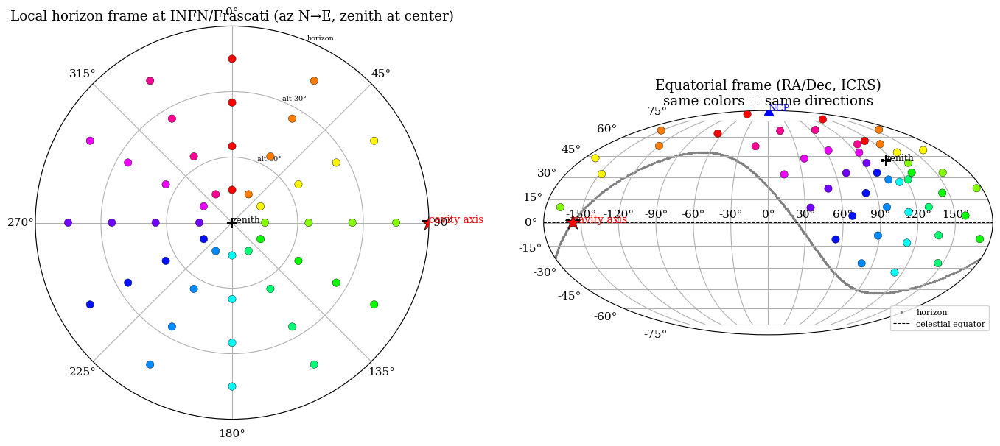

In [9]:
from astropy.coordinates import AltAz, SkyCoord

def plot_transform_visualization(axis_alt_deg=AXIS_ALT_DEG, axis_az_deg=AXIS_AZ_DEG, time_utc=TIME_UTC):
    loc = FRASCATI_LOCATION
    t = Time(time_utc)
    frame = AltAz(obstime=t, location=loc)

    def altaz_to_radec(alt, az):
        c = SkyCoord(alt=np.atleast_1d(alt) * u.deg, az=np.atleast_1d(az) * u.deg,
                     frame=frame).transform_to("icrs")
        return c.ra.deg, c.dec.deg

    def ra_to_moll(ra, dec):
        return np.radians(((np.asarray(ra) + 180) % 360) - 180), np.radians(dec)

    alts = np.array([15, 35, 55, 75])
    azs = np.arange(0, 360, 30)
    AZ, ALT = np.meshgrid(azs, alts)
    azf, altf = AZ.flatten(), ALT.flatten()
    colors = plt.cm.hsv(azf / 360.0)

    fig = plt.figure(figsize=(14, 6.2))

    # ---- LEFT: local horizon (alt/az polar) ----
    axL = fig.add_subplot(1, 2, 1, projection="polar")
    axL.set_theta_zero_location("N"); axL.set_theta_direction(-1)
    axL.scatter(np.radians(azf), 90 - altf, c=colors, s=55, edgecolor="k", lw=0.3, zorder=3)
    axL.scatter(0, 0, c="k", s=90, marker="+", zorder=4)
    axL.annotate("zenith", (0, 0), color="k", fontsize=9)
    for nm, az in [("N", 0), ("E", 90), ("S", 180), ("W", 270)]:
        axL.annotate(nm, (np.radians(az), 95), color="dimgray", fontsize=12, ha="center")
    axL.scatter(np.radians(axis_az_deg), 90 - axis_alt_deg, c="red", s=240, marker="*",
                ec="k", lw=0.5, zorder=5)
    axL.annotate("cavity axis", (np.radians(axis_az_deg), 90 - axis_alt_deg), color="red", fontsize=10)
    axL.set_rlim(0, 90); axL.set_rticks([30, 60, 90])
    axL.set_yticklabels(["alt 60°", "alt 30°", "horizon"], fontsize=7)
    axL.set_title("Local horizon frame at INFN/Frascati (az N→E, zenith at center)")

    # ---- RIGHT: equatorial Mollweide ----
    axR = fig.add_subplot(1, 2, 2, projection="mollweide")
    xm, ym = ra_to_moll(*altaz_to_radec(altf, azf))
    axR.scatter(xm, ym, c=colors, s=55, edgecolor="k", lw=0.3, zorder=3)
    hx, hy = ra_to_moll(*altaz_to_radec(np.zeros(361), np.linspace(0, 360, 361)))
    axR.scatter(hx, hy, s=2, c="gray", label="horizon")
    eq = np.linspace(-180, 180, 361)
    axR.plot(np.radians(eq), np.zeros_like(eq), "k--", lw=0.8, label="celestial equator")
    zx, zy = ra_to_moll(*altaz_to_radec(90, 0))
    axR.scatter(zx, zy, c="k", s=90, marker="+", zorder=5); axR.annotate("zenith", (zx, zy), fontsize=9)
    nx, ny = ra_to_moll(*altaz_to_radec(loc.lat.deg, 0))
    axR.scatter(nx, ny, c="blue", s=70, marker="^", zorder=5); axR.annotate("NCP", (nx, ny), color="blue", fontsize=9)
    axx, axy = ra_to_moll(*altaz_to_radec(axis_alt_deg, axis_az_deg))
    axR.scatter(axx, axy, c="red", s=240, marker="*", ec="k", lw=0.5, zorder=6)
    axR.annotate("cavity axis", (axx, axy), color="red", fontsize=10)
    axR.grid(True)
    axR.legend(loc="lower right", fontsize=8)
    axR.set_title("Equatorial frame (RA/Dec, ICRS)\nsame colors = same directions")

    plt.tight_layout()
    plt.show()

plot_transform_visualization()